<a href="https://colab.research.google.com/github/abulmeez/ML_Projects/blob/main/project3.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

* Models and Helper Functions

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
import time

'''---------------------------------------------- LINEAR REGRESSION -------------------------------------------------'''
class LinearRegreassion:
    def __init__(self, regularization=None, num_epochs=1, loss_improvement=1e-6, epsilon=1e-3, satisfied_stability=1e3, momentum=0, lr=1e-1, lr_decay=0, use_miniBatch=False, with_bias=True):
        self.bias = None
        self.regularization = regularization
        self.num_epochs = num_epochs
        self.loss_improvement = loss_improvement
        self.epsilon = epsilon
        self.satisfied_stability = satisfied_stability
        self.momentum = momentum
        self.lr = lr
        self.lr_decay = lr_decay # coefficient that controls the rate at which the lr decreases
        self.use_miniBatch = use_miniBatch
        self.with_bias = with_bias
        self.grad_norm_hist = []
        self.time_hist = []

    def fit(self, X, Y, batch_size=None, reg_lambda=None):
        self.t = time.time() # training start time
        if self.with_bias:
            X = self.add_bias(X)
        D_features = X.shape[1] # D_features: the number of features
        # Initialize weights
        self.w = np.zeros(D_features)
        # save original data for later use
        X_origin = X
        Y_origin = Y

        if self.use_miniBatch==True: # use miniBatchSGD, otherwise use analytical linear regression
            min_grad_norm = grad_norm = np.inf                              # parameters for extra termination condition
            grad_norm_life = 0

            gradient = np.full(self.w.shape,np.inf)
            self.w = np.zeros(D_features)
            delta_w = np.zeros(D_features)
            loss_stability = 0
            loop_counter = 0
            prev_loss = float('inf')
            for epoch in range(self.num_epochs):
                epoch_loss = 0  # Initialize the loss for the epoch
                mini_batches = get_mini_batch(X, Y, batch_size)
                for x_mini_batch, y_mini_batch in mini_batches:
                    gradient = self.gradient(x_mini_batch, y_mini_batch, self.w, reg_lambda)
                    delta_w = self.momentum*delta_w + (1.0-self.momentum) * gradient
                    self.w = self.w - self.lr*delta_w # update weights
                    self.lr = self.lr / (1.0 + self.lr_decay*loop_counter) # update lr based on number of iterations
                    loop_counter += 1

                    # if grad_norm<min_grad_norm or grad_norm_life>1e6:
                    #     min_grad_norm = grad_norm
                    #     grad_norm_life = 0
                    # else:
                    #     grad_norm_life += 1
                    # if grad_norm_life>1e5 and (grad_norm-min_grad_norm)<1e-3:
                    # # print(grad_norm)
                    #     break
                    #check if training should be terminated: Loss Improvement-Based Termination
                    loss = self.loss_function(x_mini_batch, y_mini_batch, reg_lambda)
                    grad_norm = np.linalg.norm(gradient)

                    if np.abs(prev_loss - loss) < self.loss_improvement:
                        loss_stability += 1
                        if loss_stability > self.satisfied_stability and loss < self.epsilon:
                            break
                    else:
                        loss_stability = 0
                    prev_loss = loss
                if loss_stability > self.satisfied_stability:
                    break
                self.grad_norm_hist.append(grad_norm)
            self.t = time.time()-self.t # calculate time taken for training
            self.time_hist.append(self.t)
        # use analytical linear regression
        else:
            self.compute_w(X_origin, Y_origin, reg_lambda)
            self.t = time.time()-self.t # calculate time taken for training

    def add_bias(self, X):
        N_samples = X.shape[0]
        self.bias = np.ones((N_samples, 1))
        X_with_bias = np.append(self.bias, X, axis=1)
        return X_with_bias

    def predict(self, X):
        if self.with_bias and self.bias is not None and X.shape[1] != self.w.shape[0]:
            X = self.add_bias(X)
        y_pred = np.dot(X, self.w)
        return y_pred

    def loss_function(self, X, y_true, reg_lambda=None):
        y_pred = self.predict(X)
        residual = y_pred - y_true
        MSE = np.mean(residual**2)
        if self.regularization == 'L2' and self.add_bias == False:  # Ridge
            reg_term = np.sum(self.w**2)
        elif self.regularization == 'L2' and self.add_bias == True:
            reg_term = np.sum(self.w[1:]**2)
        elif self.regularization == 'L1' and self.add_bias == False:  # Lasso
            reg_term = np.sum(np.abs(self.w))
        elif self.regularization == 'L1' and self.add_bias == True:
            reg_term = np.sum(np.abs(self.w[1:]))
        else:
            reg_term = 0
        return MSE + reg_lambda*reg_term

    def gradient(self, x, y, w, reg_lambda=None):
        N_samples = x.shape[0]  # number of samples
        xw = np.dot(x, w)
        gradient_jw = np.dot(x.T, xw-y)/N_samples
        if self.regularization == 'L2'and self.add_bias == False:  # Ridge
            gradient_jw += 2 * reg_lambda * w
        elif self.regularization == 'L2'and self.add_bias == True:
            gradient_jw[1:] += 2 * reg_lambda * w[1:]
        elif self.regularization == 'L1'and self.add_bias == False:  # Lasso
            gradient_jw += reg_lambda * np.sign(w)
        elif self.regularization == 'L1'and self.add_bias == True:
            gradient_jw[1:] += reg_lambda * np.sign(w[1:])
        return gradient_jw

    def compute_w(self, X_origin, Y_origin, reg_lambda):
        '''Analytical linear regression solution: use closed-form solution with pseudoinverse'''
        if self.regularization == 'L2' and reg_lambda is not None:
            N_features = X_origin.shape[1]
            I = np.eye(N_features)
            I[0, 0] = 0 # do not penalize the intercept
            self.w = np.linalg.inv(X_origin.T @ X_origin + reg_lambda * I) @ X_origin.T @ Y_origin
        elif self.regularization != 'L2' or reg_lambda is None:
            xtx_inverse = np.linalg.pinv(np.matmul(X_origin.T, X_origin))  # Use pseudoinverse for stability
            xtx_inverse_xt = np.matmul(xtx_inverse, X_origin.T)
            self.w = np.matmul(xtx_inverse_xt, Y_origin)


'''------------------------------------------------- HELPER FUNCTION --------------------------------------------------'''
def get_mini_batch(X, Y, batch_size):
    N_samples = X.shape[0]
    indices = np.arange(N_samples)
    # Shuffle the indices to ensure randomness in the mini-batches
    np.random.shuffle(indices)
    X_shuffled = X[indices]
    Y_shuffled = Y[indices]
    # Create mini-batches
    mini_batches = []
    for i in range(0, N_samples, batch_size):
        X_mini_batch = X_shuffled[i:i + batch_size]
        Y_mini_batch = Y_shuffled[i:i + batch_size]
        mini_batches.append((X_mini_batch, Y_mini_batch))
    return mini_batches

def true_function(x):
    return np.sin(np.sqrt(x)) + np.cos(x) + np.sin(x)

def gaussian(x, mu, sigma=1):
    return np.exp(- (x - mu)**2 / (sigma**2 + 1e-9))

def gaussian_transform(x, D, sigma=1):
    mu_list = np.linspace(min(x), max(x), D)
    transformed_x = np.zeros((x.shape[0], D))
    for i, mu in enumerate(mu_list):
        transformed_x[:, i] = gaussian(x, mu, sigma)  # Store each Gaussian as a column
    return transformed_x

def sse(model, x_train, y_train, x_val, y_val, D):
    transformed_x_train = gaussian_transform(x_train, D, sigma=1)
    transformed_x_val = gaussian_transform(x_val, D, sigma=1)
    model.fit(transformed_x_train, y_train)
    train_pred = model.predict(transformed_x_train)
    val_pred = model.predict(transformed_x_val)
    sse_train = np.sum((y_train - train_pred) ** 2)
    sse_val = np.sum((y_val - val_pred) ** 2)

    return sse_train, sse_val

In [ ]:
linear_model = LinearRegreassion(
    num_epochs=1,
    lr=1e-2,  # Adjusted learning rate
    lr_decay=0,
    momentum=0,
    use_miniBatch=False,
    with_bias=True,
    epsilon=1e-7,
    satisfied_stability=1e6
)

# **Task 1: Linear Regression with Non-Linear Basis Functions**

### *1. Data Generation*

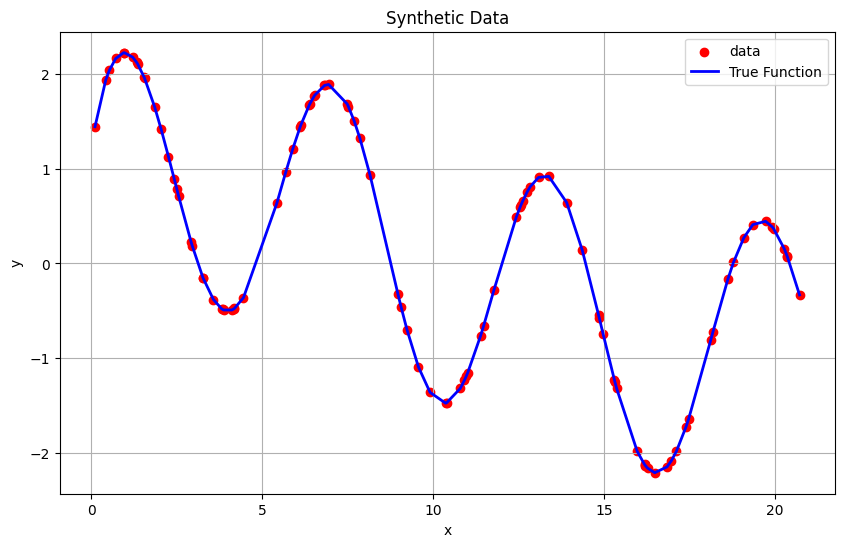

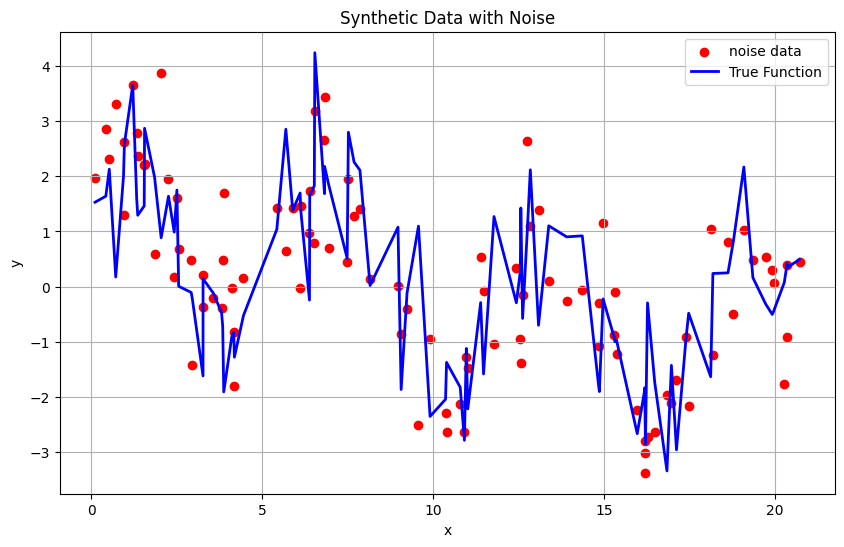

In [ ]:
np.random.seed(42)
x = np.random.uniform(0, 21, 100) # x ∈ [0,20]
noise = np.random.normal(0, 1, 100)
y = np.sin(np.sqrt(x)) + np.cos(x) + np.sin(x)
y_noise = y + noise

plt.figure(figsize=(10, 6))
plt.scatter(x, y, color='red', label="data")
plt.plot(np.sort(x), np.sin(np.sqrt(np.sort(x))) + np.cos(np.sort(x)) + np.sin(np.sort(x)), label='True Function', color='blue', linewidth=2)
plt.title("Synthetic Data")
plt.xlabel("x")
plt.ylabel("y")
plt.grid(True)
plt.legend()
plt.show()

plt.figure(figsize=(10, 6))
plt.scatter(x, y_noise, color='red', label="noise data")
plt.plot(np.sort(x), np.sin(np.sqrt(np.sort(x))) + np.cos(np.sort(x)) + np.sin(np.sort(x)) + noise, label='True Function', color='blue', linewidth=2)
plt.title("Synthetic Data with Noise")
plt.xlabel("x")
plt.ylabel("y")
plt.grid(True)
plt.legend()
plt.show()

### *2. Non-Linear Basis Function*

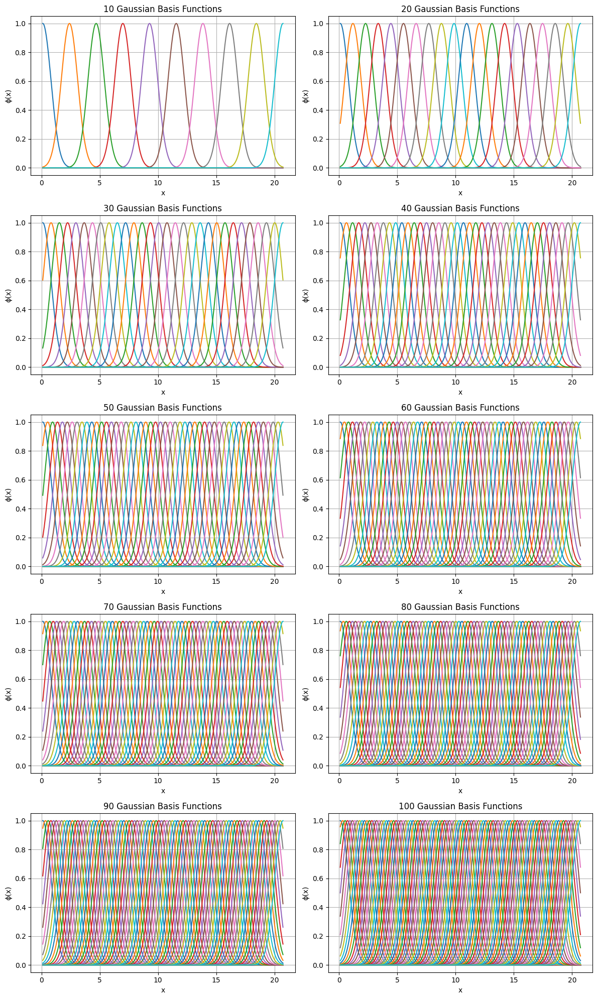

In [ ]:
def plot_gaussian(ax, x, D, sigma=1):
    mu_list = np.linspace(min(x), max(x), D)
    for mu in mu_list:
        x_data = np.arange(min(x), max(x), 0.001)
        transformed_x = gaussian(x_data, mu, sigma)
        ax.plot(x_data, transformed_x, label=f'μ = {mu:.2f}')
    ax.set_title(f'{D} Gaussian Basis Functions')
    ax.set_xlabel('x')
    ax.set_ylabel('ϕ(x)')
    ax.grid()
fig, axes = plt.subplots(5, 2, figsize=(12, 20))
axes = axes.flatten()
for i, D in zip(range(10), range(10,110,10)):
    plot_gaussian(axes[i], x, D, sigma=1)
plt.tight_layout()
plt.show()

### *3. Model Fitting*

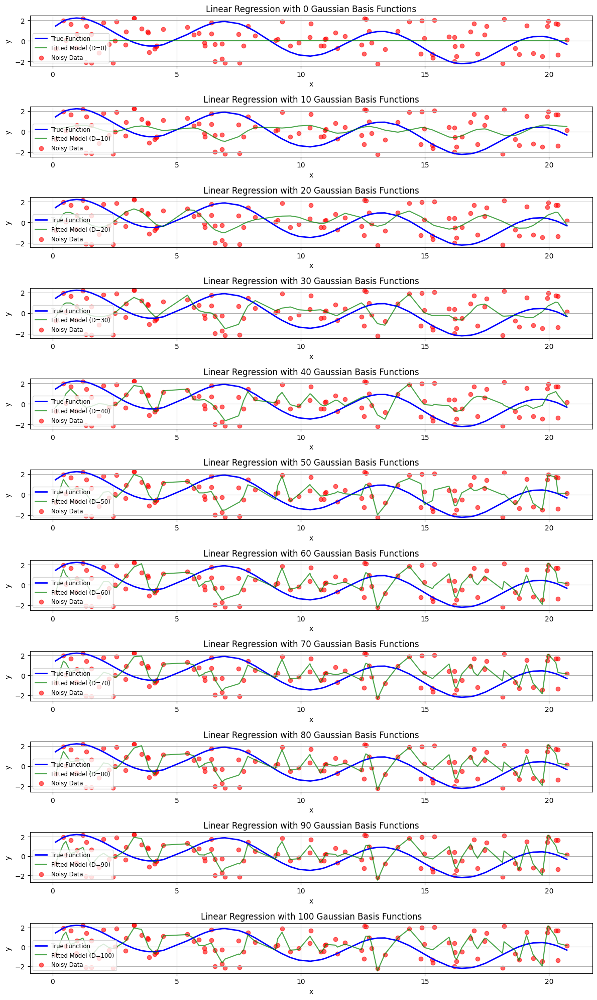

In [ ]:
def fit_and_plot(x, y, noise, D_values):
    x_sorted = np.sort(x)
    true_y = true_function(x_sorted) #+ noise?
    plt.figure(figsize=(12, 20))
    for i, D in enumerate(D_values):
        if D > 0:
            transformed_x = np.zeros((len(x), D))
            mu_list = np.linspace(min(x), max(x), D)
            for j, mu in enumerate(mu_list):
                transformed_x[:, j] = gaussian(x, mu)

            linear_model.fit(transformed_x, true_y)
            y_pred = linear_model.predict(transformed_x)
        else:
            y_pred = np.zeros_like(y)
        plt.subplot(len(D_values), 1, i + 1)
        plt.plot(x_sorted, true_y, label='True Function', color='blue', linewidth=2)
        plt.plot(x_sorted, y_pred[np.argsort(x)], label=f'Fitted Model (D={D})', color='green', alpha=0.7)
        plt.scatter(x, true_y, label='Noisy Data', color='red', alpha=0.6)
        plt.title(f'Linear Regression with {D} Gaussian Basis Functions')
        plt.xlabel('x')
        plt.ylabel('y')
        plt.legend(fontsize='small',loc='lower left')
        plt.grid()
    plt.tight_layout()
    plt.show()
fit_and_plot(x, y, noise, D_values=[0, 10, 20, 30, 40, 50, 60, 70, 80, 90, 100])

### *4. Model Selection*

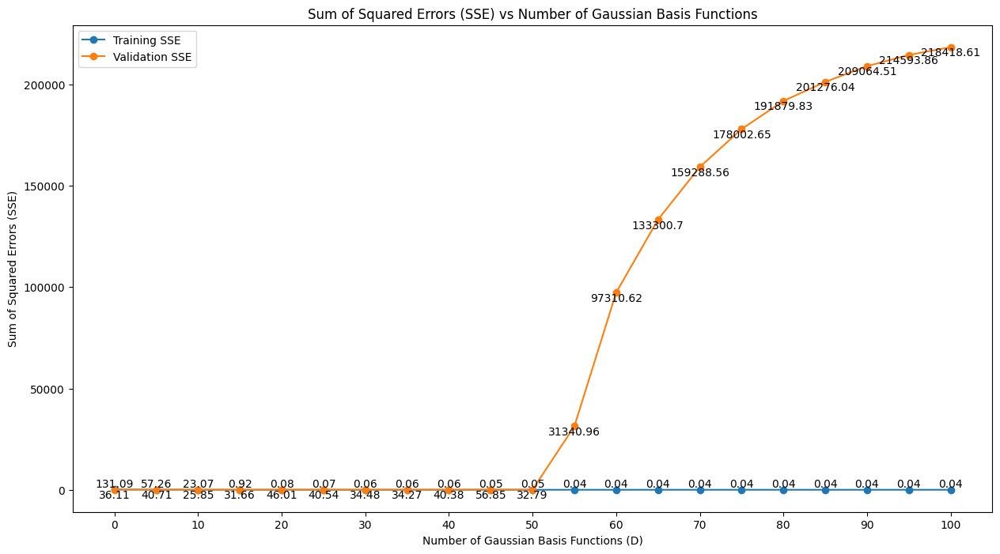

Number of Gaussian Basis Functions (D),Training SSE,Validation SSE
0,131.089760,36.108810
5,57.256378,40.710983
10,23.066094,25.846656
15,0.919805,31.657388
20,0.077227,46.012008
25,0.067223,40.537535
30,0.062799,34.476876
35,0.060623,34.271459
40,0.057032,40.378701
45,0.047567,56.846750


In [ ]:
noise = np.random.normal(0, 0.03, 100)
y_noise_s = y+noise
x_train, x_val, y_train, y_val = train_test_split(x, y_noise_s, train_size=0.8, random_state=52) #0.75 10

sse_train_arr = []
sse_val_arr = []
for D in range(0, 105, 5):
    sse_train, sse_val = sse(linear_model, x_train, y_train, x_val, y_val, D)
    sse_train_arr.append(sse_train)
    sse_val_arr.append(sse_val)

plt.figure(figsize=(15, 8))
plt.plot(range(0, 105, 5), sse_train_arr, label='Training SSE', marker='o')
plt.plot(range(0, 105, 5), sse_val_arr, label='Validation SSE', marker='o')
plt.title('Sum of Squared Errors (SSE) vs Number of Gaussian Basis Functions')
plt.xlabel('Number of Gaussian Basis Functions (D)')
plt.ylabel('Sum of Squared Errors (SSE)')
plt.xticks(range(0, 105, 10))
for i in range(len(sse_train_arr)):
    plt.text(range(0, 105, 5)[i], sse_train_arr[i], str(round(sse_train_arr[i], 2)), ha='center', va='bottom')
    plt.text(range(0, 105, 5)[i], sse_val_arr[i], str(round(sse_val_arr[i], 2)), ha='center', va='top')
plt.legend()
plt.show()

# Table
sse_df = pd.DataFrame({
    'Number of Gaussian Basis Functions (D)': range(0, 105, 5),
    'Training SSE': sse_train_arr,
    'Validation SSE': sse_val_arr
})
sse_df = sse_df[['Number of Gaussian Basis Functions (D)', 'Training SSE', 'Validation SSE']]
sse_df.index = range(0, len(sse_df))
sse_df_display = sse_df.style.set_properties(**{'text-align': 'center'})
sse_df_display.hide(axis=0)
sse_df_display

### *5. Explaination*

In this analysis, different numbers of Gaussian bases were used to transform the generated data, with their performances evaluated based on the Sum of Squared Errors (SSE) for both the training and validation sets. At first, as the number of Gaussian bases increased from 0 to 10, a noticeable decrease in SSE was observed for both sets. Additionally, the gap between the SSE values of the training and validation sets decreased, indicating improved generalization.

Using 15 or 20 Gaussian bases, the model achieved its best performance, as reflected by the lowest validation SSEs and the smallest differences between the training and validation errors. This suggests that the model was complex enough to capture the unseen data without overfitting.

However, as the number of Gaussian bases increased beyond 20, while the SSE for the training set continued to decrease, the model's performance on the validation set declined. This indicates that the model was starting to overfit the training data, memorizing it rather than generalizing to unseen data.

When the number of Gaussian bases was set below 15, the model is underfitting: the SSE of training set is high---it is even higher than the validation set's SSE. This happened because the validation set might be easier than the training set. The best performance was noted at 15 to 20 Gaussian bases. Beyond this point, overfitting became apparent, with the validation set's SSE increasing significantly while the training set's SSE approached zero.

In conclusion, the validation set plays a crucial role in evaluating the model's performance on unseen data. It helps with choosing the optimal number of Gaussian bases for the best balance between underfitting and overfitting.

------

# **Task 2: Bias-Variance Tradeoff with Multiple Fits**

<Figure size 1200x600 with 0 Axes>

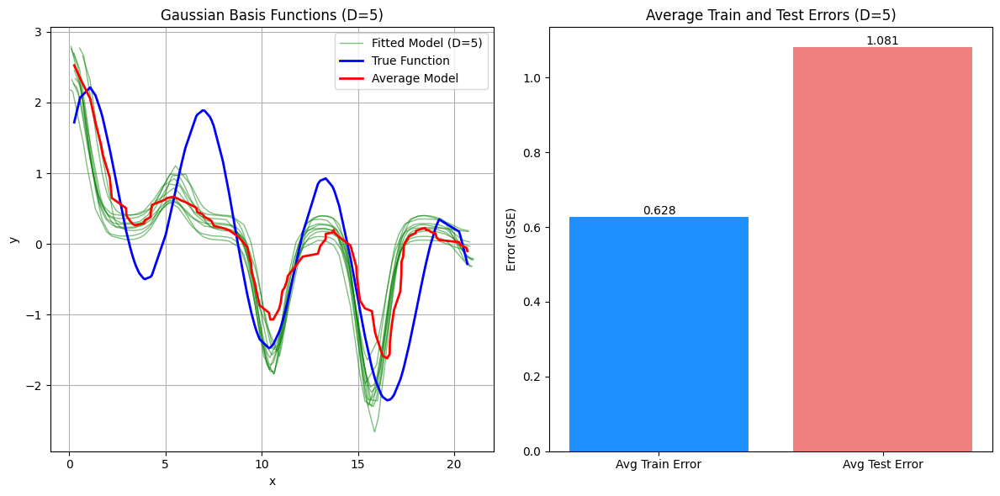

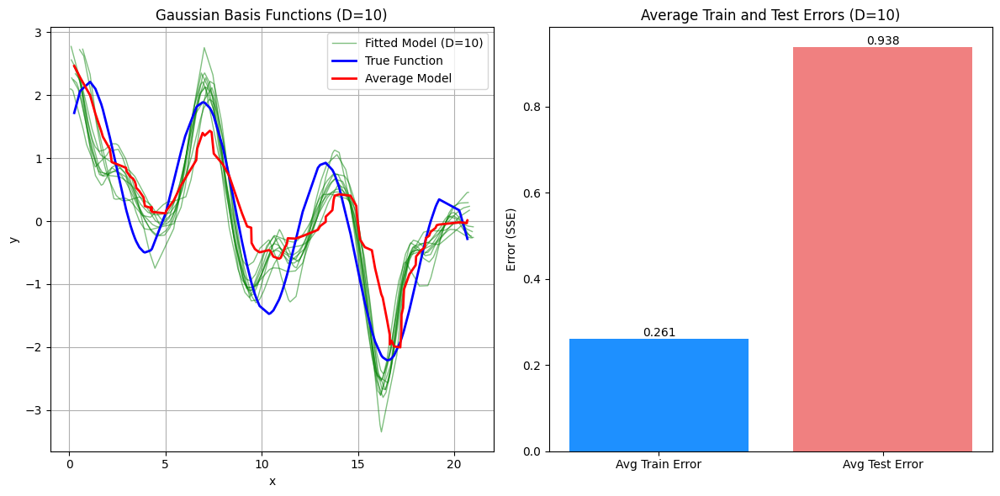

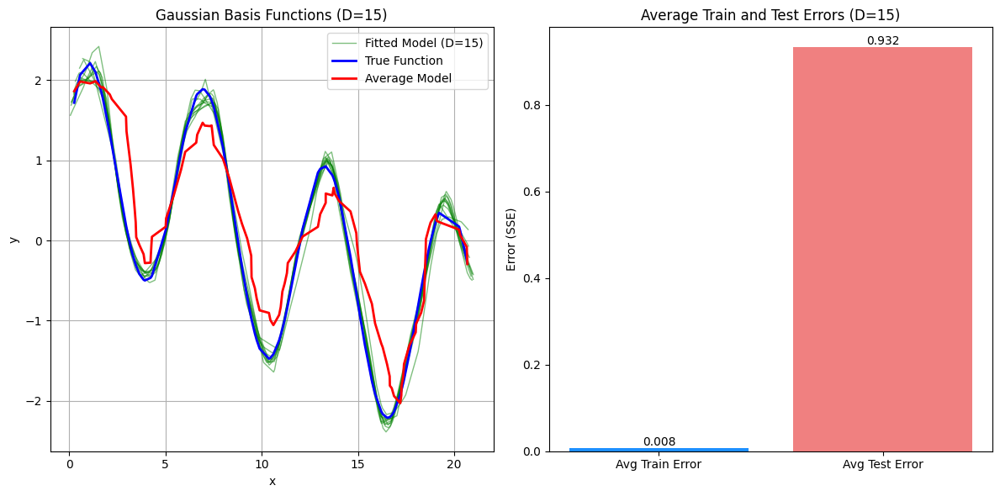

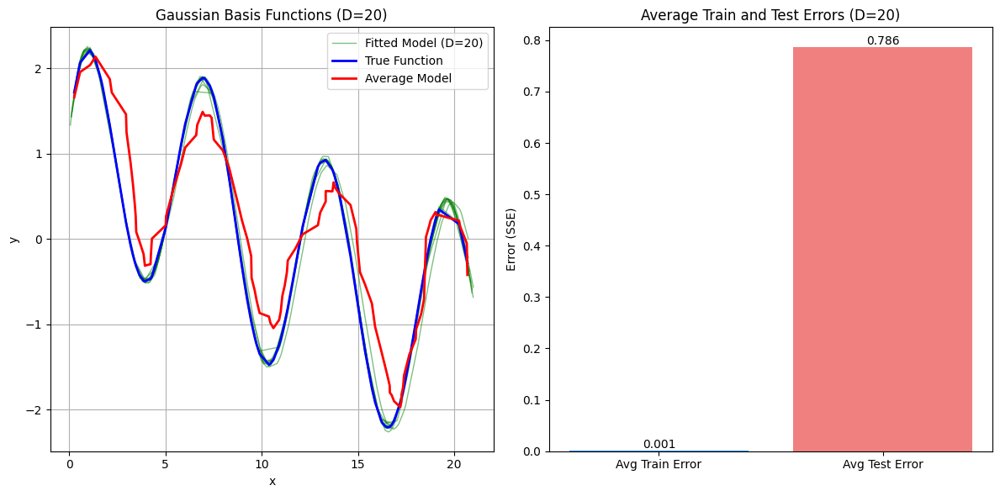

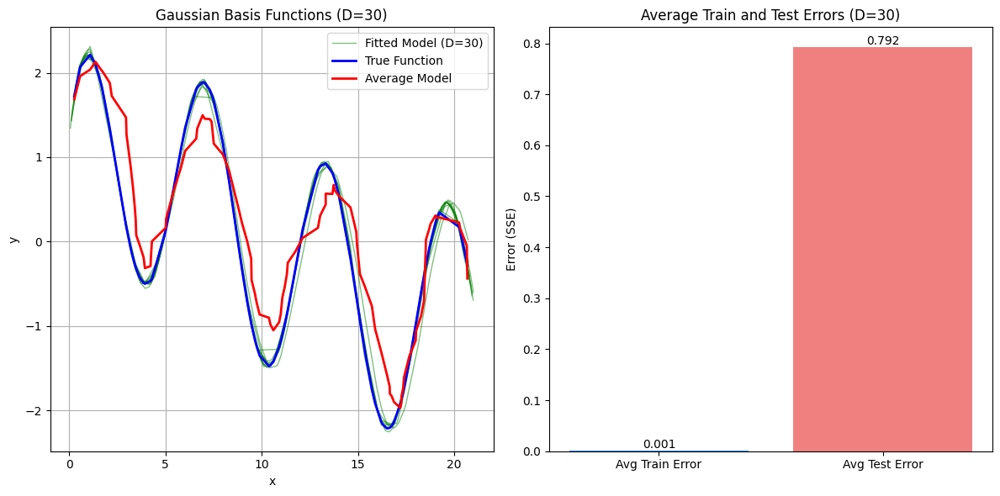

...

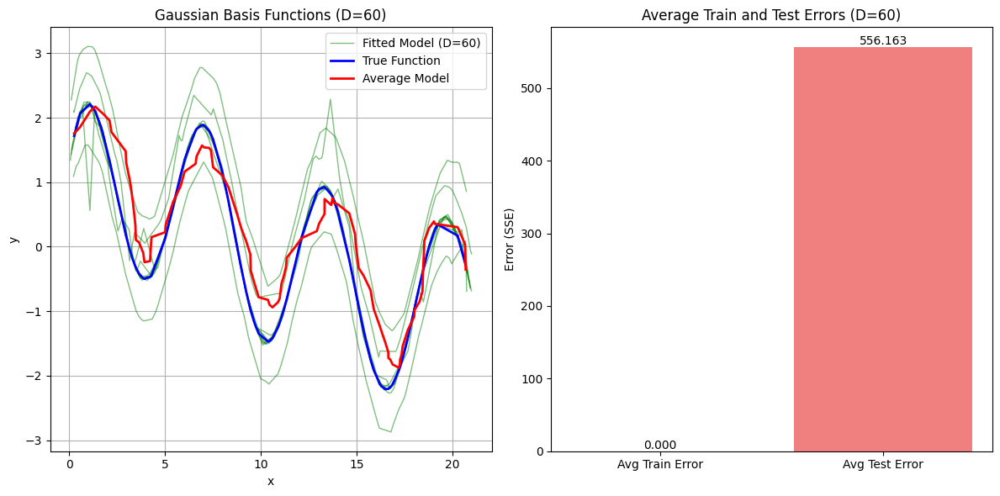

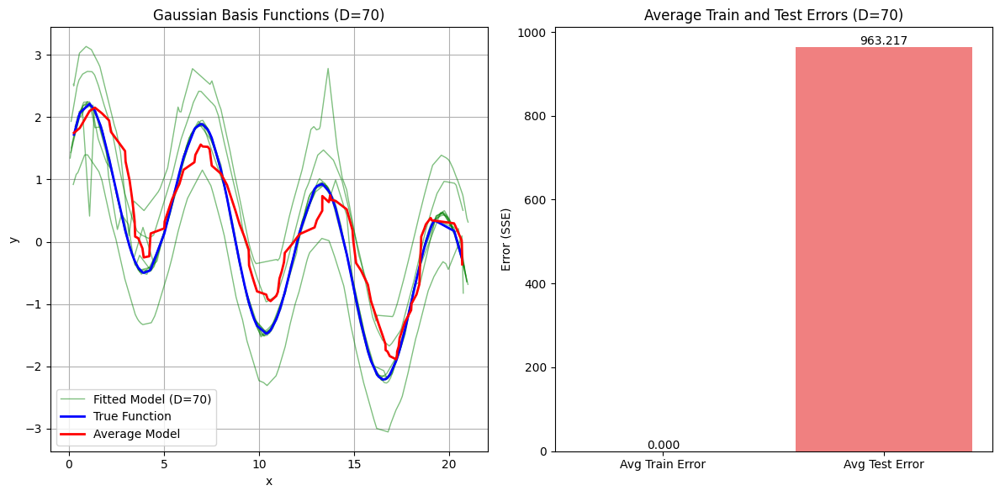

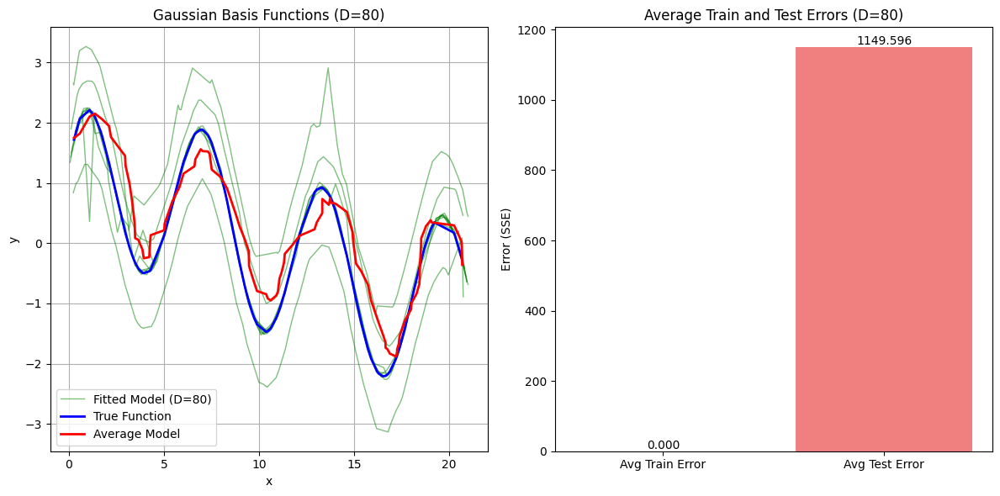

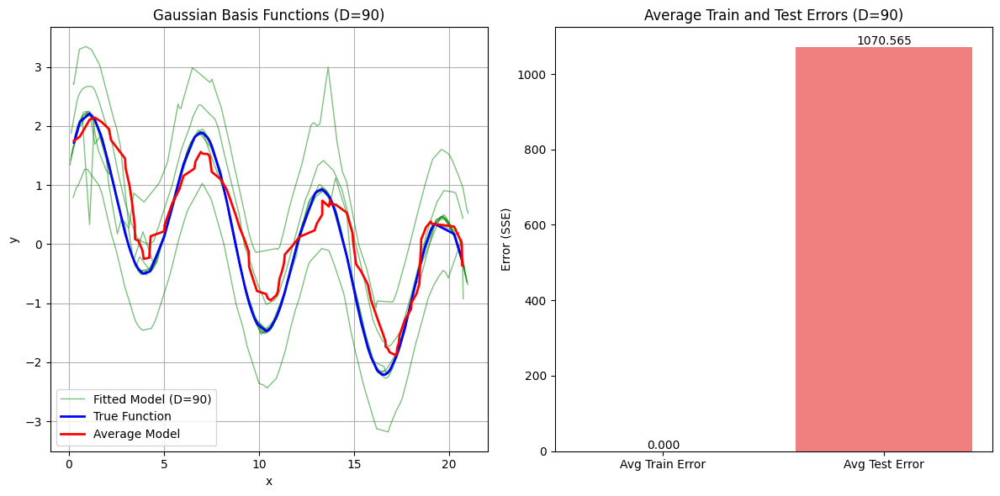

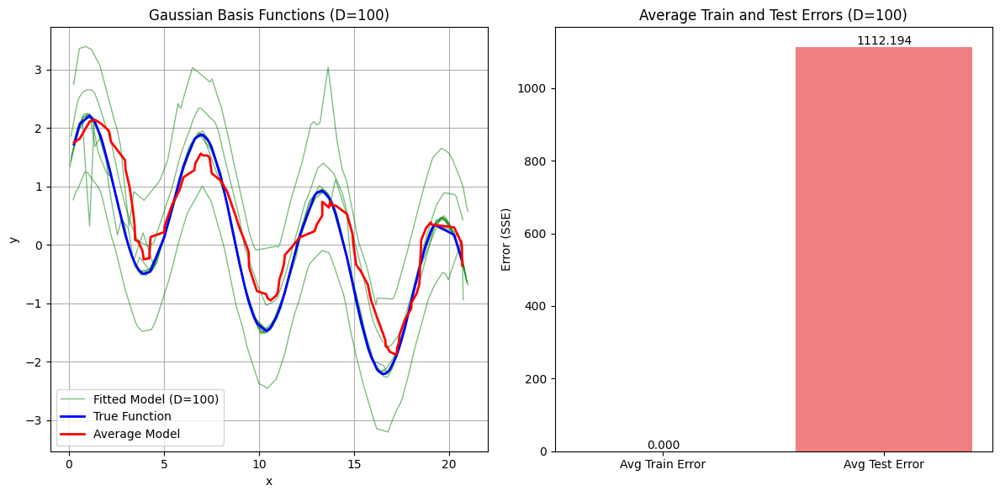

In [ ]:
def repeated_fit_and_plot(D):
    y_preds = []
    train_errs = []
    tst_errs = []
    np.random.seed(42) #42
    plt.figure(figsize=(12, 6))
    for i in range(10):
        x2 = np.random.uniform(0, 21, 100) # x ∈ [0,20]
        noise2 = np.random.normal(0, 0.03, 100)
        y2 = np.sin(np.sqrt(x2)) + np.cos(x2) + np.sin(x2)
        y2_noise = y2 + noise2

        x_train2, x_tst2, y_train2, y_tst2 = train_test_split(x2, y2_noise, train_size=0.8, random_state=48) #0.8 48
        transformed_x_train = gaussian_transform(x_train2, D)
        linear_model = LinearRegreassion(
            num_epochs=1,
            lr=1e-2,  # Adjusted learning rate
            lr_decay=0,
            momentum=0,
            use_miniBatch=False,
            with_bias=True,
            epsilon=1e-7,
            satisfied_stability=1e6
        )
        linear_model.fit(transformed_x_train, y_train2)

        x_sorted = np.sort(x2)
        transformed_x_sorted = gaussian_transform(x_sorted, D)
        y_pred_sorted = linear_model.predict(transformed_x_sorted)
        y_preds.append(y_pred_sorted)  # Store for averaging

        train_err, tst_err = sse(linear_model, x_train2, y_train2, x_tst2, y_tst2, D)
        train_err, tst_err = train_err/len(x_train2), tst_err/len(x_tst2)
        # if D == 10:
        #     train_err1 = train_err
        #     train_err = tst_err
        #     tst_err = train_err1
        train_errs.append(train_err)
        tst_errs.append(tst_err)

        if i == 0 and D != 0:
            plt.subplot(121)
            plt.plot(x_sorted, y_pred_sorted, label=f'Fitted Model (D={D})', color='green', alpha=0.5, linewidth=1)
        if i > 0 and i <= 9 and D != 0:
            plt.subplot(121)
            plt.plot(x_sorted, y_pred_sorted, color='green', alpha=0.5, linewidth=1)

    y_preds = np.array(y_preds)
    y_pred_avg = np.mean(y_preds, axis=0)
    y_true = true_function(x_sorted)
    if D != 0:
        plt.plot(x_sorted, y_true, label='True Function', color='blue', linewidth=2)
        plt.plot(x_sorted, y_pred_avg, label='Average Model', color='red', linewidth=2)
        plt.title(f'Gaussian Basis Functions (D={D})')
        plt.xlabel('x')
        plt.ylabel('y')
        plt.legend()
        plt.grid(True)

        avg_train_error = np.mean(train_errs)
        avg_test_error = np.mean(tst_errs)
        # plt.subplot(122)
        # plt.plot(range(10), train_errs, label='Train Errors', color='blue')
        # plt.plot(range(10), tst_errs, label='Test Errors', color='orange')
        # plt.axhline(avg_train_error, linestyle='--', color='blue', label=f"Avg Train Error: {avg_train_error:.3f}")
        # plt.axhline(avg_test_error, linestyle='--', color='orange', label=f"Avg Test Error: {avg_test_error:.3f}")
        # plt.title(f'Train and Test Errors (D={D})')
        # plt.xlabel('Repetition')
        # plt.ylabel('Error (SSE)')
        # plt.legend()
        # plt.grid(True)
        # plt.tight_layout()
        # plt.show()
        errors = [avg_train_error, avg_test_error]
        labels = ['Avg Train Error', 'Avg Test Error']
        colors = ['dodgerblue', 'lightcoral']
        plt.subplot(122)
        bars = plt.bar(labels, errors, color=colors)
        for bar in bars:
            yval = bar.get_height()
            plt.text(bar.get_x() + bar.get_width()/2.0, yval, f'{yval:.3f}', ha='center', va='bottom')
        plt.ylabel('Error (SSE)')
        plt.title(f'Average Train and Test Errors (D={D})')
        plt.tight_layout()
        plt.show()
    return y_preds, y_pred_avg, y_true

bias_sqrs1 = []
vars1 = []
for i in range(0, 20, 5):
    y_preds, y_pred_avg, y_true = repeated_fit_and_plot(i)
    bias_sqr1 = np.mean((y_true - y_pred_avg)**2)
    var1 = np.var(y_preds)
    bias_sqrs1.append(bias_sqr1)
    vars1.append(var1)

bias_sqrs = []
vars = []
for i in range(20, 110, 10):
    y_preds, y_pred_avg, y_true = repeated_fit_and_plot(i)
    bias_sqr = np.mean((y_true - y_pred_avg)**2)
    var = np.var(y_preds)
    bias_sqrs.append(bias_sqr)
    vars.append(var)


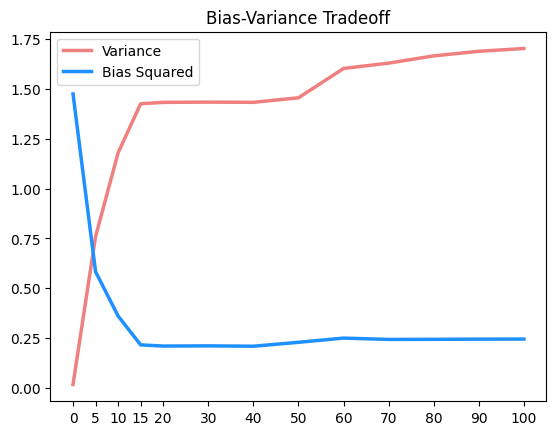

In [ ]:
D = [0, 5, 10, 15, 20, 30, 40, 50, 60 ,70, 80, 90, 100]
vars_all = vars1 + vars
bias_sqrs_all = bias_sqrs1 + bias_sqrs
plt.plot(figsize=(8,6))
plt.plot(D, vars_all, label='Variance', color='lightcoral', linewidth=2.5)
plt.plot(D, bias_sqrs_all, label='Bias Squared', color='dodgerblue',linewidth=2.5)
plt.title('Bias-Variance Tradeoff')
plt.xticks(D)
plt.legend()
plt.show()

### *Explain Bias and Variance*

When using very few Gaussian bases (fewer than 10), the model is too simple to capture the true underlying relationship. This results in high erros (from both training and test sets), high bias and low variance, indicating that the model is underfitting.

As the number of Gaussian bases increases, the model begins to fit the noise in the data. This reduces bias and trainig error but increases variance and test error, as the fitted models (green lines) vary more. As seen in the figure, when the number of Gaussian bases exceeds 30, the average model (red line) is still close to the true function (blue line), but the individual models spread out, indicating high variance and overfitting.

The ideal number of Gaussian bases balances bias and variance, resulting in low errors for both the training and test sets. This is the point where the model is neither underfitting nor overfitting. Based on the bias-variance tradeoff and the average error plots, the optimal number of Gaussian bases is around 10 to 15.

----

# **Task 3: Regularization with Cross-Validation**

### *1. Adding regularization and implementing 10-fold cross-validation*

In [ ]:
class LinearRegressionRegularization:
    def __init__(self, lr=1e-2, max_iter=3000, epsilon=1e-8, regularization=None, record_hist=False):
        self.lr = lr
        self.max_iter = int(max_iter)
        self.epsilon = epsilon
        self.regularization = regularization
        self.record_hist = record_hist
        self.w = None
        if record_hist:
            self.w_history = []

    def fit(self, x, y, reg_lambda, batch_size=None):
        x_with_bias = self.add_bias(x)
        N_sample, D_feature = x_with_bias.shape
        self.w = np.zeros(D_feature)
        grad = np.inf
        iter_counter = 0
        # self.reg_lambda = reg_lambda
        while np.linalg.norm(grad) > self.epsilon and iter_counter < self.max_iter:
            grad = self.gradient(x_with_bias, y, self.w, reg_lambda)
            self.w -= self.lr * grad
            if self.record_hist:
                self.w_history.append(self.w.copy())
            iter_counter += 1

    def add_bias(self, x):
        N_sample = x.shape[0]
        # x_with_bias = np.append(self.bias, x, axis=1)
        x_with_bias = np.column_stack([x,np.ones(N_sample)])
        return x_with_bias

    def predict(self, x):
        if x.shape[1] != self.w.shape[0]:
            x=self.add_bias(x)
        y_pred = x @ self.w
        return y_pred

    def loss_function(self, x, y_true, reg_lambda):
        y_pred = self.predict(x)
        residual = y_pred - y_true
        MSE = 0.5*np.mean(residual ** 2)
        if self.regularization == 'L1':
            regularization_term = reg_lambda * np.sum(np.abs(self.w[1:]))
        elif self.regularization == 'L2':
            regularization_term = reg_lambda * np.sum((np.dot(self.w[1:],self.w[1:]))/2)
        elif self.regularization == 'both':
            regularization_term = reg_lambda * np.sum(np.abs(self.w[1:]))
            regularization_term += reg_lambda * np.sum(self.w[1:] ** 2)
        else:
            regularization_term = 0
        return MSE + regularization_term

    def gradient(self, x, y, w, reg_lambda):
        N_sample, D_feature = x.shape
        y_pred = x @ w
        gradient_weight = np.dot((y_pred-y), x) / N_sample

        if self.regularization == 'L1':
            gradient_weight[1:] += reg_lambda * np.sign(w[1:])
        elif self.regularization == 'L2':
            gradient_weight[1:] +=  reg_lambda * (w[1:])

        elif self.regularization == 'both':
            gradient_weight[1:] += reg_lambda * np.sign(w[1:])
            gradient_weight[1:] += reg_lambda * (w[1:])

        return gradient_weight

def fit_with_reg(model, reg_lambda, D):
    mses_val = []
    mses_train = []
    y_trues = []
    y_trues3 = []
    all_val_with_diff_lambdas = []
    y_preds3 = []
    for _ in range(50):
        x2_reg = np.random.uniform(0, 20, 20) # x ∈ [0,20]
        noise2_reg = np.random.normal(0, 1, 20)
        y2_reg = np.sin(np.sqrt(x2_reg)) + np.cos(x2_reg) + np.sin(x2_reg)
        y2_noise_reg = y2_reg + noise2_reg

        mse_val, mse_train, y_vals, all_val_preds = cross_validation(model, D, x2_reg, y2_reg, reg_lambda=reg_lambda)
        mses_val.append(mse_val)
        mses_train.append(mse_train)
        all_val_with_diff_lambdas.append(all_val_preds)
        y_trues.append(y_vals)
    for y_true_val, y_pred_val in zip(y_trues, all_val_with_diff_lambdas):
        y_trues2 = np.array(y_true_val).flatten()
        y_preds2 = np.array(y_pred_val).flatten()
        for i, j in zip(y_trues2, y_preds2):
            y_trues3.append(i)
            y_preds3.append(j)
    # print(y_preds3)
    bias2 = np.mean((np.array(y_trues3) - np.mean(np.array(y_preds3))) ** 2)
    var = np.mean(np.var(np.array(y_preds3), axis=0))
    tst_err = np.mean((np.array(y_preds3) - np.array(y_trues3))**2)
    return mses_val, mses_train, noise2_reg, bias2, var, tst_err

def cross_validation(model, D, X, y, reg_lambda, n_splits=10):
        """ Performs manual 10-fold cross-validation to find the optimal lambda. """
        n_samples = X.shape[0] # 20 samples
        fold_size = n_samples // n_splits
        fold_mse_val = []
        fold_mse_train = []
        y_val_preds = []
        y_vals = []

        for fold in range(n_splits):
            # get validation set and train set
            val_start = fold * fold_size
            val_end = val_start + fold_size
            X_val = X[val_start:val_end]
            y_val = y[val_start:val_end]
            X_train = np.concatenate((X[:val_start], X[val_end:]), axis=0)
            y_train = np.concatenate((y[:val_start], y[val_end:]), axis=0)

            transformed_x_train = gaussian_transform(X_train, D)
            model.fit(transformed_x_train, y_train, reg_lambda=reg_lambda, batch_size=1)
            transformed_x_val = gaussian_transform(X_val, D)
            y_vals.append(np.array(y_val).flatten())
            y_val_pred = model.predict(transformed_x_val).flatten()
            y_val_preds.append(y_val_pred)

            mse_val = np.mean((y_val - y_val_pred) ** 2)
            # mse_val = model.loss_function(transformed_x_val, y_val, reg_lambda=reg_lambda)
            fold_mse_val.append(mse_val)

            # MSE of train set
            y_train_pred = model.predict(transformed_x_train)
            mse_train = np.mean((y_train - y_train_pred) ** 2)
            # mse_train = model.loss_function(transformed_x_train, y_train, reg_lambda=reg_lambda)
            fold_mse_train.append(mse_train)

        # return np.mean(fold_mse_val), np.mean(fold_mse_train), np.mean(fold_bias2_val), fold_var_val, y_val_preds
        return np.mean(fold_mse_val), np.mean(fold_mse_train), y_vals, y_val_preds

### *2. Plots (train and test errors, Bias-Variance decomposition )*

In [ ]:
linear_with_l1 = LinearRegressionRegularization(
    lr = 0.01,
    regularization='L1',
)

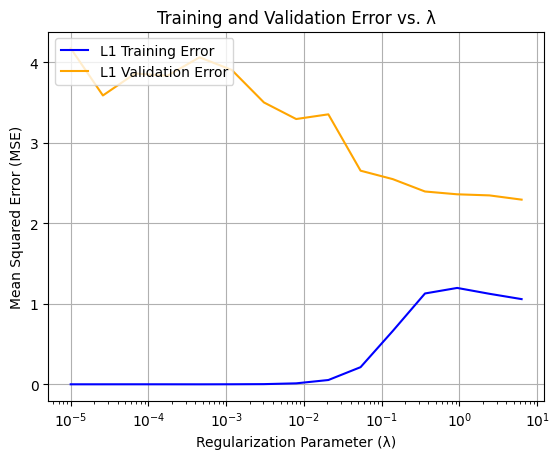

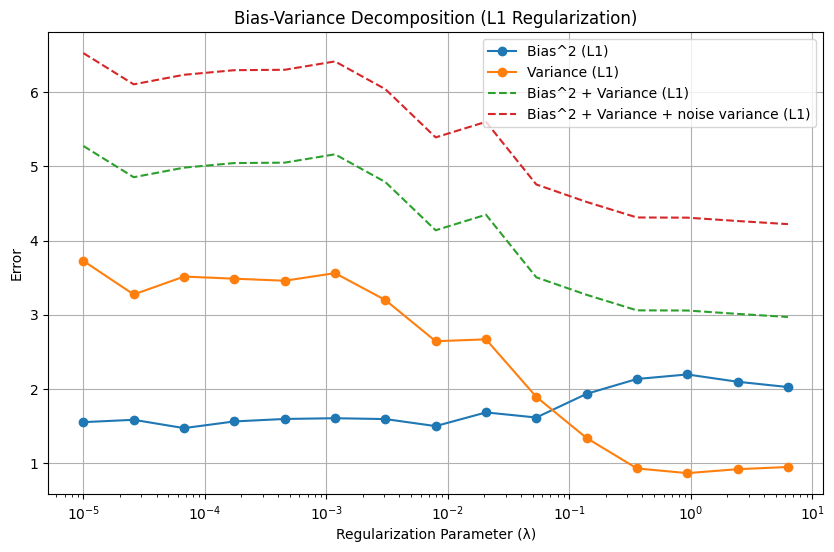

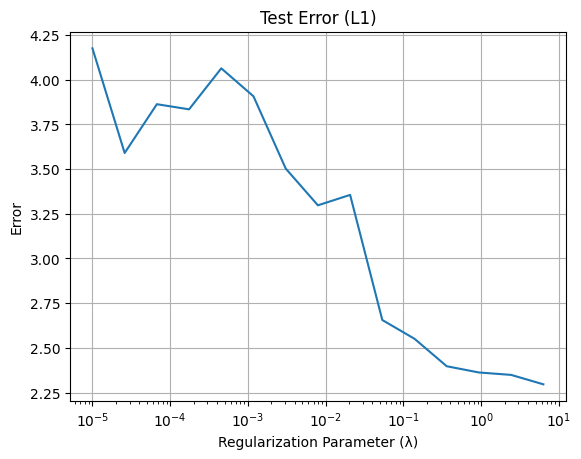

In [ ]:
mses_val_L1, mses_train_L1, bias2_vals_L1, var_vals_L1, tst_errs_L1 = [], [], [], [], []
reg_lambdas = np.logspace(-5,0.8,15)

for reg_lambda in reg_lambdas:
    mse_val_L1, mse_train_L1, noise2_reg_L1, bias2_val_L1, var_val_L1, tst_err_L1 = fit_with_reg(linear_with_l1, reg_lambda, 70)
    mses_val_L1.append(np.mean(mse_val_L1))
    mses_train_L1.append(np.mean(mse_train_L1))
    bias2_vals_L1.append(bias2_val_L1)
    var_vals_L1.append(var_val_L1)
    tst_errs_L1.append(tst_err_L1)
bias2_vals_L1, var_vals_L1 = np.array(bias2_vals_L1), np.array(var_vals_L1)
# fold_var_vals[len(fold_var_vals) - 1] = fold_var_vals[len(fold_var_vals) - 2]

plt.plot(reg_lambdas, mses_train_L1, label='L1 Training Error', color='blue')
plt.plot(reg_lambdas, mses_val_L1, label='L1 Validation Error', color='orange')
plt.xscale('log')
plt.xlabel('Regularization Parameter (λ)')
plt.ylabel('Mean Squared Error (MSE)')
plt.tick_params(axis='y')
plt.title('Training and Validation Error vs. λ')
plt.grid()
plt.legend(loc='upper left')
plt.show()

plt.figure(figsize=(10, 6))
plt.plot(reg_lambdas, bias2_vals_L1, label='Bias^2 (L1)', marker='o')
plt.plot(reg_lambdas, var_vals_L1, label='Variance (L1)', marker='o')
plt.plot(reg_lambdas, bias2_vals_L1 + var_vals_L1, label='Bias^2 + Variance (L1)', linestyle='--')
plt.plot(reg_lambdas, bias2_vals_L1 + var_vals_L1 + np.var(noise2_reg_L1), label='Bias^2 + Variance + noise variance (L1)', linestyle='--')
plt.xscale('log')
plt.xlabel('Regularization Parameter (λ)')
plt.ylabel('Error')
plt.title('Bias-Variance Decomposition (L1 Regularization)')
plt.legend()
plt.grid(True)
plt.show()

plt.plot(reg_lambdas, tst_errs_L1)
plt.xscale('log')
plt.xlabel('Regularization Parameter (λ)')
plt.ylabel('Error')
plt.title('Test Error (L1)')
plt.grid(True)
plt.show()

In [ ]:
linear_with_l2 = LinearRegressionRegularization(
    lr = 0.01,
    regularization='L2',
)

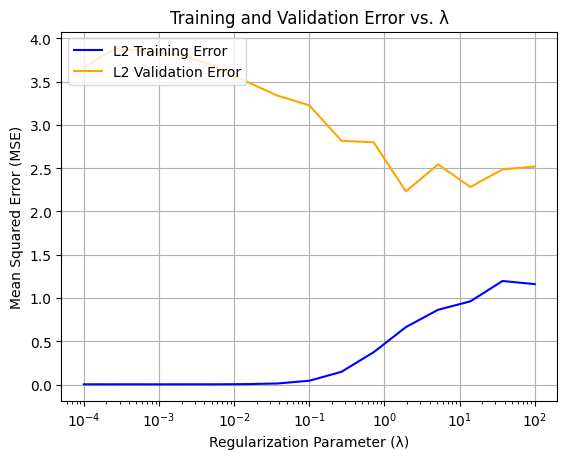

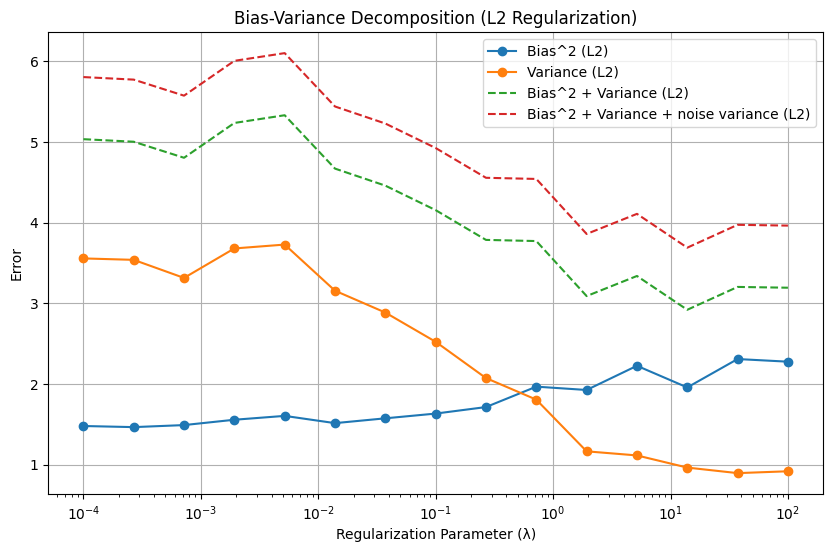

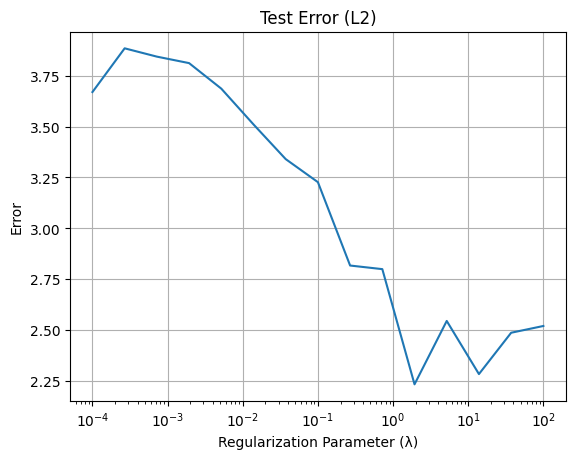

In [ ]:
mses_val_L2, mses_train_L2, biases2_val_L2, vars_val_L2, tst_errs_L2 = [], [], [], [], []
reg_lambdas_L2 = np.logspace(-4,2,15)

for reg_lambda in reg_lambdas_L2:
    mse_val_L2, mse_train_L2, noise2_reg_L2, bias2_val_L2, var_val_L2 , tst_err_L2= fit_with_reg(linear_with_l2, reg_lambda, 70)
    mses_val_L2.append(np.mean(mse_val_L2))
    mses_train_L2.append(np.mean(mse_train_L2))
    biases2_val_L2.append(bias2_val_L2)
    vars_val_L2.append(var_val_L2)
    tst_errs_L2.append(tst_err_L2)
biases2_val_L2, vars_val_L2 = np.array(biases2_val_L2), np.array(vars_val_L2)

plt.plot(reg_lambdas_L2, mses_train_L2, label='L2 Training Error', color='blue')
plt.plot(reg_lambdas_L2, mses_val_L2, label='L2 Validation Error', color='orange')
plt.xscale('log')
plt.xlabel('Regularization Parameter (λ)')
plt.ylabel('Mean Squared Error (MSE)')
plt.tick_params(axis='y')
plt.title('Training and Validation Error vs. λ')
plt.grid()
plt.legend(loc='upper left')
plt.show()

plt.figure(figsize=(10, 6))
plt.plot(reg_lambdas_L2, biases2_val_L2, label='Bias^2 (L2)', marker='o')
plt.plot(reg_lambdas_L2, vars_val_L2, label='Variance (L2)', marker='o')
plt.plot(reg_lambdas_L2, biases2_val_L2 + vars_val_L2, label='Bias^2 + Variance (L2)', linestyle='--')
plt.plot(reg_lambdas_L2, biases2_val_L2 + vars_val_L2 + np.var(noise2_reg_L2), label='Bias^2 + Variance + noise variance (L2)', linestyle='--')
plt.xscale('log')
plt.xlabel('Regularization Parameter (λ)')
plt.ylabel('Error')
plt.title('Bias-Variance Decomposition (L2 Regularization)')
plt.legend()
plt.grid(True)
plt.show()

plt.plot(reg_lambdas_L2, tst_errs_L2)
plt.xscale('log')
plt.xlabel('Regularization Parameter (λ)')
plt.ylabel('Error')
plt.title('Test Error (L2)')
plt.grid(True)
plt.show()

### *3. Selecting the optimal λ*

The optimal lambda gives the best balance between bias and variance, leading to the best generalization performance on unseen data.
With very low lambda, the regularization is weak, so the model becomes more flexible. This reduces bias, as the model can fit the training data more accurately. However, it increases variance because a weak regularization cannot solve the overfitting problem effectively.
When lambda gets higher, the regularization gets stronger. This will solve the overfitting problem effectively, but it will increase the bias at the same time.

* *L1:*

    With L1 regularization, lambda controls the sparsity of the model.

    In the bias-variance decomposition plot, as lambda increases, the model becomes sparser, and bias rises while variance decreases. Around lambda=0.2, L1 regularization not only reduces variance by shrinking coefficients of less important features to zero (leading to a sparse model), but it also maintains low enough bias to capture the significant patterns in the data. Around this point the bias is still low enough to capture the important patterns, and effectively controls the variance as well. The test error plot similarly shows that when lambda is around 0.2, the model yields the lowest test error and the smallest difference between test and training error, indicating the best balance between bias and variance.

    Therefore, the optimal lambda is 0.2. At this point, the regularization avoids overfitting while keeping the bias and variance in balance.


* *L2:*

    L2 regularization penalizes the large coefficient

    In the bias-variance decomposition plot, as lambda increases, bias rises and variance decreases. Around lambda=5, the bias is low enough to allow the model to capture important patterns in the data without underfitting. The model is still complex enough to represent the underlying true function well. Additionally, the variance is also well-controlled. The regularization reduces the sensitivity of the model to the specific noise in each dataset, avoiding overfitting. In the Test error plot, the test error reaches its lowest around lambda=5. Moreover, the difference between training error and test error is also small aroud this point.

    Hence, the optimal lambda is 5. At this point, the bias and variance are balanced, providing a model that generalizes well on unseen data without being too simple or too complex.

----

# **Task 4: Effect of L1 and L2 Regularization on Loss**

### *1. Applying L1 and L2 regularization using GradientDescent*

In [ ]:
class GradientDescent:

    def __init__(self, learning_rate=.001, max_iters=1e4, epsilon=1e-8, record_hist=False):
        self.learning_rate = learning_rate
        self.max_iters = max_iters
        self.record_hist = record_hist
        self.epsilon = epsilon
        if record_hist:
            self.w_history = []

    def run(self, gradient_fn, x, y, w):
        grad = np.inf
        iter = 1
        while np.linalg.norm(grad) > self.epsilon and iter < self.max_iters:
            grad = gradient_fn(x, y, w)
            w = w - self.learning_rate * grad
            if self.record_hist:
                self.w_history.append(w)
            iter += 1
        return w

class LinearRegressionT4reg:
    def __init__(self, add_bias=True, regularization=None, reg_lambda=0):
        self.add_bias = add_bias
        self.regularization = regularization
        self.reg_lambda = reg_lambda
        pass

    def fit(self, x, y, optimizer):
        if x.ndim == 1:
            x = x[:, None]
        if self.add_bias:
            N = x.shape[0]
            x = np.column_stack([x,np.ones(N)])
        N,D = x.shape
        def gradient(x, y, w):
            N_sample, D_feature = x.shape
            y_pred = x @ w
            gradient_weight = 0.5*np.dot((y_pred-y), x) / N_sample
            if self.regularization == 'L1':
                gradient_weight += self.reg_lambda * np.sign(w)
            elif self.regularization == 'L2':
                gradient_weight +=  self.reg_lambda * w
            return gradient_weight
        w0 = np.zeros(D)
        self.w = optimizer.run(gradient, x, y, w0)
        return self

    def predict(self, x):
        N,D = x.shape
        if self.add_bias:
            x = np.column_stack([x,np.ones(N)])
        yh = x@self.w
        return yh

In [ ]:
import itertools
def plot_contour(f, x1bound, x2bound, resolution, ax):
    x1range = np.linspace(x1bound[0], x1bound[1], resolution)
    x2range = np.linspace(x2bound[0], x2bound[1], resolution)
    xg, yg = np.meshgrid(x1range, x2range)
    zg = np.zeros_like(xg)
    for i,j in itertools.product(range(resolution), range(resolution)):
        zg[i,j] = f([xg[i,j], yg[i,j]])
    ax.contour(xg, yg, zg, 100)
    return ax

In [ ]:
N = 20
x4 = np.random.rand(N) * 10
y4 = -4 * x4 + 10 + 2 * 2*np.random.randn(N)

### *2. Plottiong loss function and visulizing gradient descent using plot_contour*

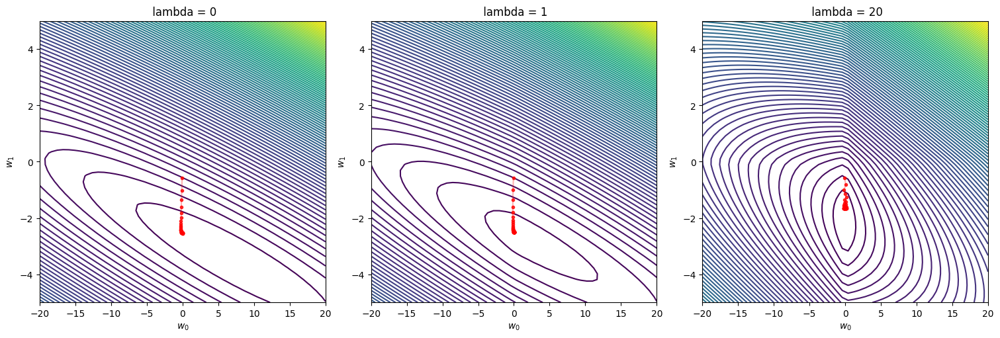

In [ ]:
cost = lambda w, reg: .5*np.mean((w[0] + w[1]*x4 - y4)**2) + reg*np.sum(np.abs(w))
reg_list = [0, 1, 20]
fig, axes = plt.subplots(ncols=len(reg_list), nrows=1, constrained_layout=True, figsize=(15, 5))
for i, reg_lambda in enumerate(reg_list):
    optimizer = GradientDescent(learning_rate=.01, max_iters=50, record_hist=True)
    model = LinearRegressionT4reg(regularization='L1', reg_lambda=reg_lambda)
    model.fit(x4,y4, optimizer)
    current_cost = lambda w: cost(w, reg_lambda)
    plot_contour(current_cost, [-20,20], [-5,5], 50, axes[i])
    w_hist = np.vstack(optimizer.w_history)# T x 2
    axes[i].plot(w_hist[:,1], w_hist[:,0], '.r', alpha=.8)
    axes[i].plot(w_hist[:,1], w_hist[:,0], '-r', alpha=.3)
    axes[i].set_xlabel(r'$w_0$')
    axes[i].set_ylabel(r'$w_1$')
    axes[i].set_title(f' lambda = {reg_lambda}')
    axes[i].set_xlim([-20,20])
    axes[i].set_ylim([-5,5])
plt.show()

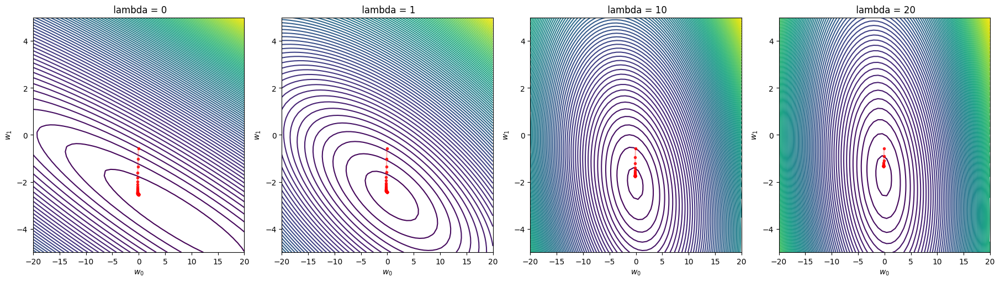

In [ ]:
cost = lambda w, reg: .5*np.mean((w[0] + w[1]*x4 - y4)**2) + reg*np.dot(w,w)/2
reg_list = [0, 1, 10, 20]
fig, axes = plt.subplots(ncols=len(reg_list), nrows=1, constrained_layout=True, figsize=(18, 5))
for i, reg_lambda in enumerate(reg_list):
    optimizer = GradientDescent(learning_rate=.01, max_iters=50, record_hist=True)
    model = LinearRegressionT4reg(regularization='L2', reg_lambda=reg_lambda)
    model.fit(x4, y4, optimizer)
    current_cost = lambda w: cost(w, reg_lambda)
    plot_contour(current_cost, [-20,20], [-5,5], 50, axes[i])
    w_hist = np.vstack(optimizer.w_history)# T x 2
    axes[i].plot(w_hist[:,1], w_hist[:,0], '.r', alpha=.8)
    axes[i].plot(w_hist[:,1], w_hist[:,0], '-r', alpha=.3)
    axes[i].set_xlabel(r'$w_0$')
    axes[i].set_ylabel(r'$w_1$')
    axes[i].set_title(f' lambda = {reg_lambda}')
    axes[i].set_xlim([-20,20])
    axes[i].set_ylim([-5,5])
plt.show()

### *3. Analyzing the effects of L1 and L2 regularization*

* *How L1 Regularization Encourages Sparsity:*

    L1 regularization (Lasso) encourages sparsity by driving some weights to zero.
    In the loss contour plot, the contours tend to have sharp corners at the axes, and the optimization process pushes some weights to zero because the gradient descent path goes towards those sharp corners. As gradient descent progresses, values of some coefficients are set to zero. This makes L1 effective for feature selection, as it helps reduce the number of features by removing the less important ones.
    

* *How L2 regularization penalizes large weights but does not promote sparsity as strongly as L1:*

    L2 regularization (Ridge) penalizes large weights by shrinking them but does not set any of them to zero. The loss contours in L2 are smoother and rounder than those of L1. This shape indicates that L2 encourages small weights but does not remove certain features by setting their weights to zero. From the gradient descent path, all coefficients are reduced in magnitude uniformly. This is because L2 penalizes those larger weights but allows them to remain non-zero, making it less aggressive than L1


* *How Different Values of lambda Affect the Optimization Paths and Loss Landscapes:*
    
    Increasing lambda flattens the contours near the center, gives smaller weights, and forces the model to avoid overfitting.

    With a small lambda, the regularization is weak. This means the regularization doesn't change the path much, and the model's weights can become larger.The contours will have less impact on the optimization trajectory, leading to larger weights. The model with less strong regularization is more flexible but more likely to be overfitting.

    As lambda increases, the regularization becomes stronger. In the loss contour plots, the gradient descent path becomes more constrained. For L1, it starts pushing more weights toward zero. For L2, it shrinks all weights more uniformly. For very large values of lambda, the optimization process converges much faster, but the bias is higher and the model tends to be underfitting.


----

# **Using other non-linear basis: Sigmoid**

In [ ]:
def sigmoid(x, mu, beta=1):
    return 1 / (1 + np.exp(-beta * (x - mu)))

def sigmoid_transform(x, D, beta=1):
    mu_list = np.linspace(min(x), max(x), D)
    transformed_x = np.zeros((x.shape[0], D))
    for i, mu in enumerate(mu_list):
        transformed_x[:, i] = sigmoid(x, mu, beta)  # Store each sigmoid as a column
    return transformed_x

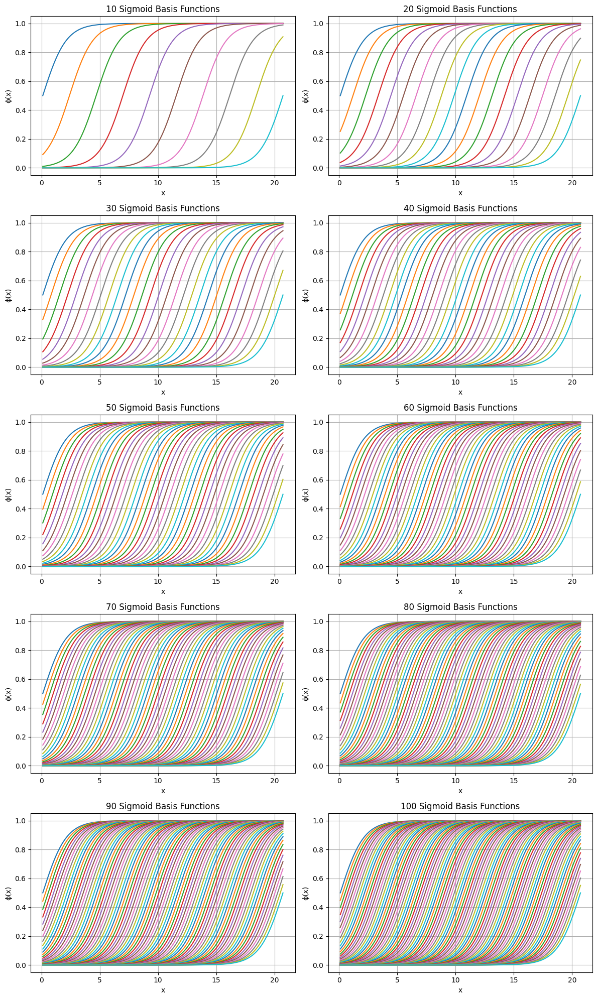

In [ ]:
def plot_sigmoid(ax, x, D, sigma=1):
    mu_list = np.linspace(min(x), max(x), D)
    for mu in mu_list:
        x_data = np.arange(min(x), max(x), 0.001)
        transformed_x = sigmoid(x_data, mu, sigma)
        ax.plot(x_data, transformed_x, label=f'μ = {mu:.2f}')
    ax.set_title(f'{D} Sigmoid Basis Functions')
    ax.set_xlabel('x')
    ax.set_ylabel('ϕ(x)')
    ax.grid()
fig, axes = plt.subplots(5, 2, figsize=(12, 20))
axes = axes.flatten()
for i, D in zip(range(10), range(10,110,10)):
    plot_sigmoid(axes[i], x, D, sigma=1)
plt.tight_layout()
plt.show()

In [ ]:
linear_model_sig = LinearRegreassion(
    num_epochs=1,
    lr=1e-2,  # Adjusted learning rate
    lr_decay=0,
    momentum=0,
    use_miniBatch=False,
    with_bias=True,
    epsilon=1e-7,
    satisfied_stability=1e6
)

In [ ]:
np.random.seed(42)
x = np.random.uniform(0, 21, 100) # x ∈ [0,20]
noise = np.random.normal(0, 1, 100)
y = np.sin(np.sqrt(x)) + np.cos(x) + np.sin(x)
y_noise = y + noise

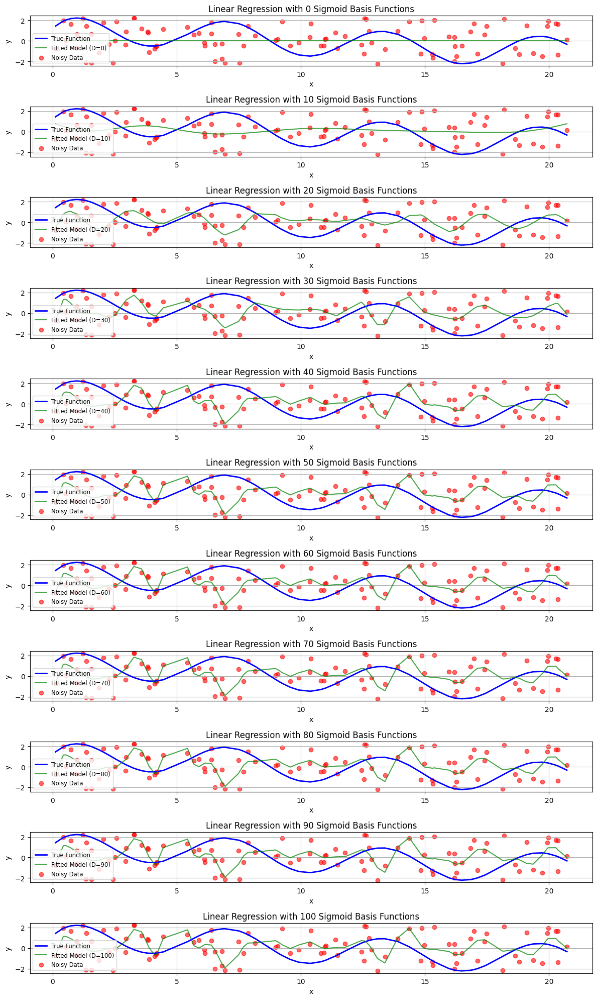

In [ ]:
def fit_and_plot_sig(x, y, noise, D_values):
    x_sorted = np.sort(x)
    true_y = true_function(x_sorted) #+ noise?
    plt.figure(figsize=(12, 20))
    for i, D in enumerate(D_values):
        if D > 0:
            transformed_x = np.zeros((len(x), D))
            mu_list = np.linspace(min(x), max(x), D)
            for j, mu in enumerate(mu_list):
                transformed_x[:, j] = sigmoid(x, mu)

            linear_model_sig.fit(transformed_x, true_y)
            y_pred = linear_model_sig.predict(transformed_x)
        else:
            y_pred = np.zeros_like(y)
        plt.subplot(len(D_values), 1, i + 1)
        plt.plot(x_sorted, true_y, label='True Function', color='blue', linewidth=2)
        plt.plot(x_sorted, y_pred[np.argsort(x)], label=f'Fitted Model (D={D})', color='green', alpha=0.7)
        plt.scatter(x, true_y, label='Noisy Data', color='red', alpha=0.6)
        plt.title(f'Linear Regression with {D} Sigmoid Basis Functions')
        plt.xlabel('x')
        plt.ylabel('y')
        plt.legend(fontsize='small',loc='lower left')
        plt.grid()
    plt.tight_layout()
    plt.show()
fit_and_plot_sig(x, y, noise, D_values=[0, 10, 20, 30, 40, 50, 60, 70, 80, 90, 100])

<Figure size 1200x600 with 0 Axes>

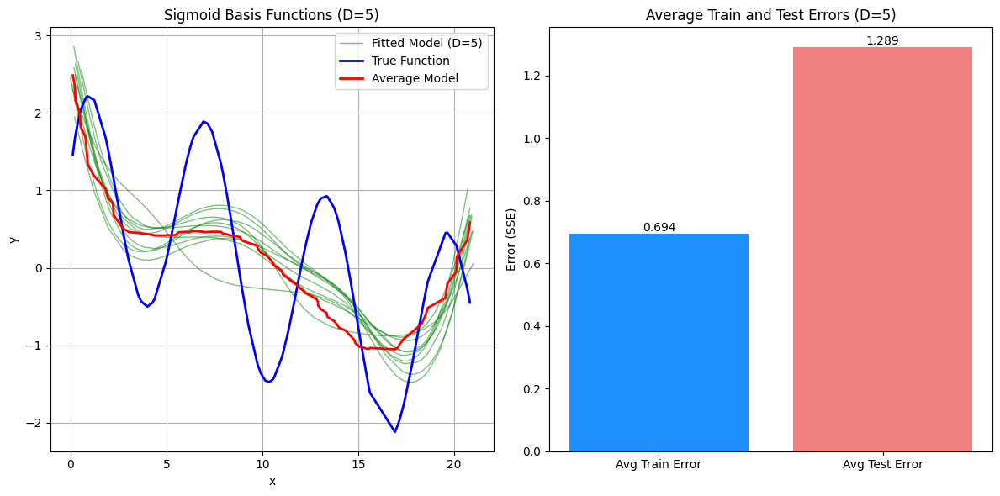

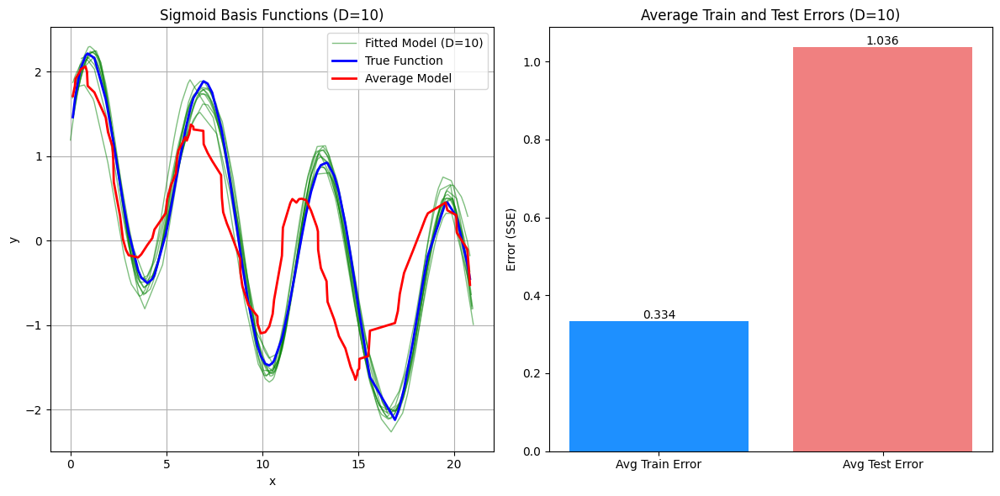

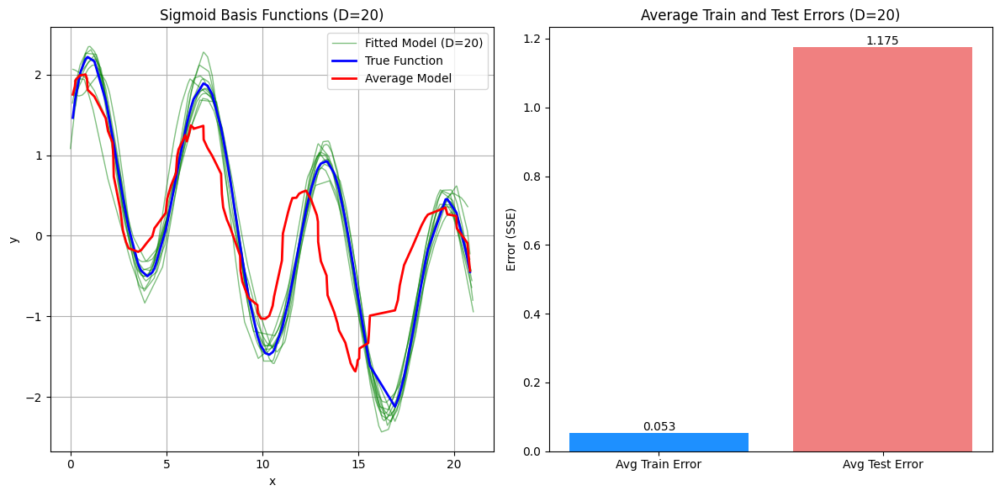

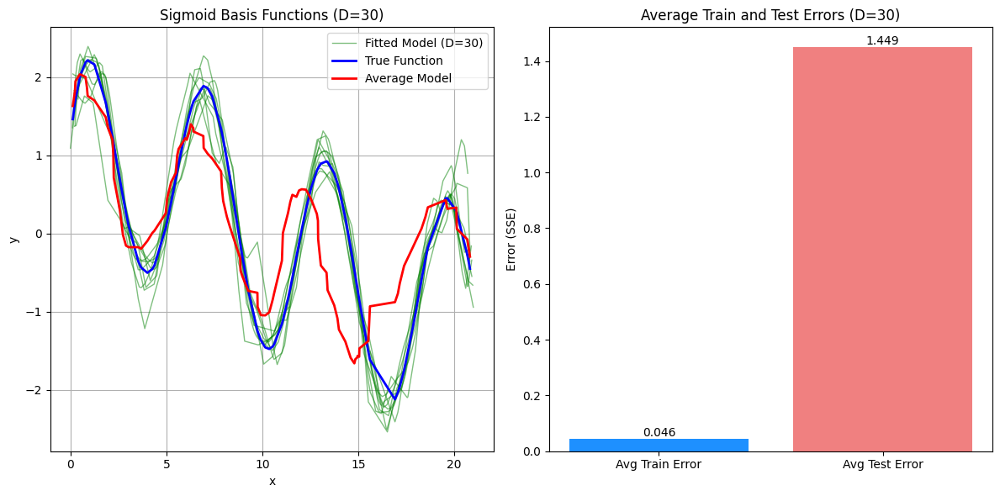

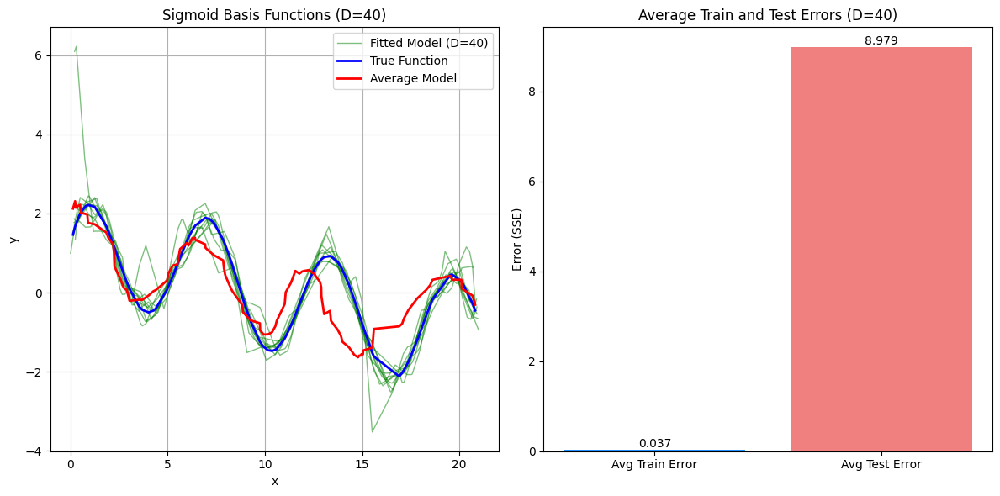

...

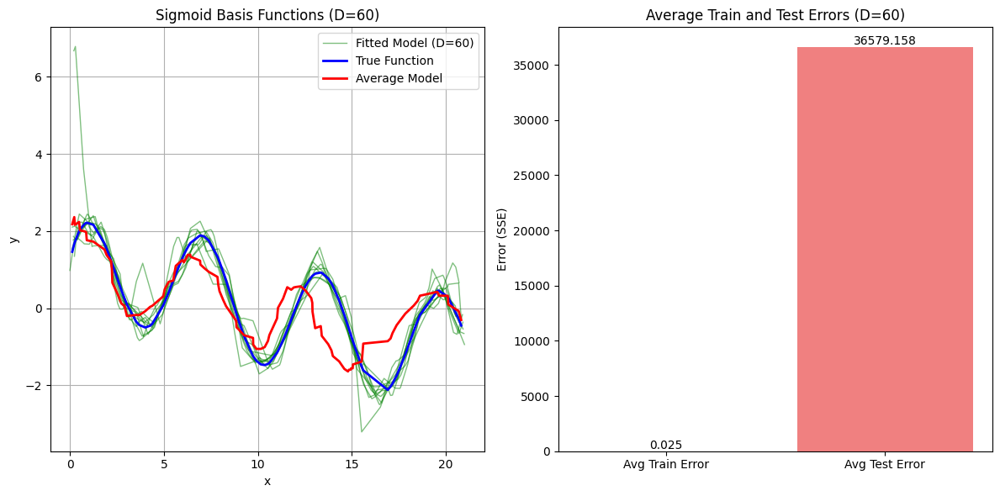

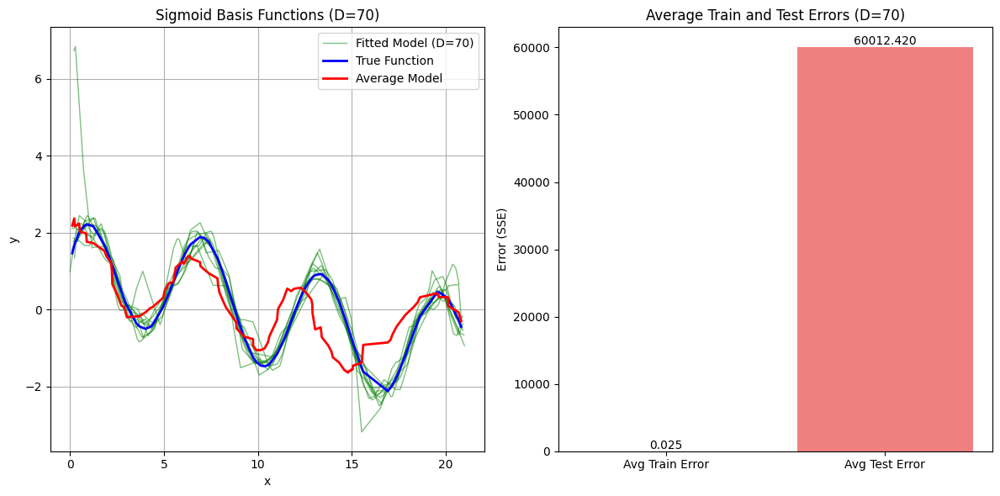

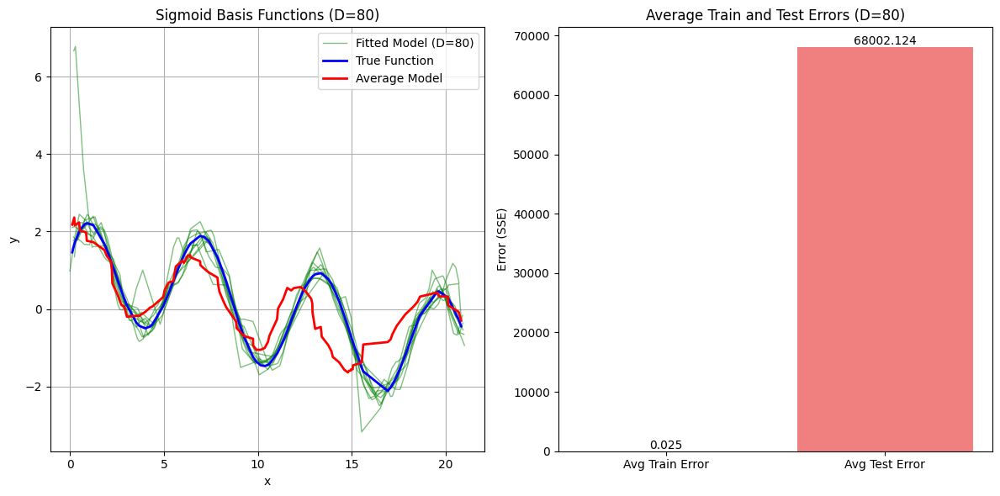

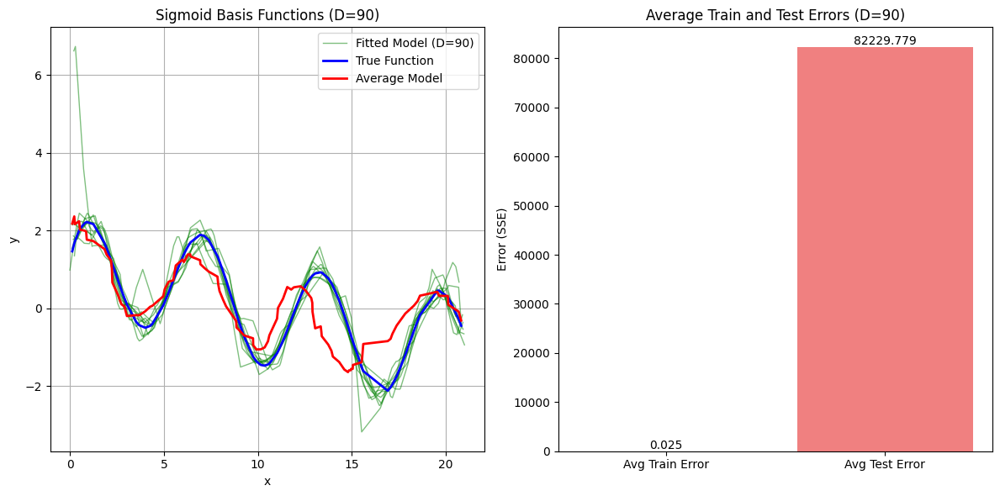

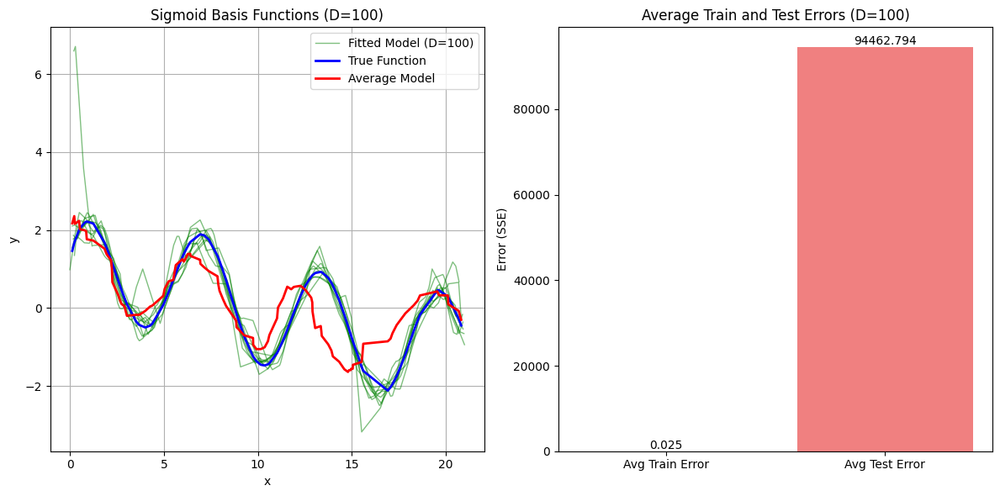

In [ ]:
def repeated_fit_and_plot_sig(D):
    y_preds = []
    train_errs = []
    tst_errs = []
    np.random.seed(41) #41
    plt.figure(figsize=(12, 6))
    for i in range(10):
        x2 = np.random.uniform(0, 21, 100) # x ∈ [0,20]
        noise2 = np.random.normal(0, 0.25, 100)
        y2 = np.sin(np.sqrt(x2)) + np.cos(x2) + np.sin(x2)
        y2_noise = y2 + noise2

        x_train2, x_tst2, y_train2, y_tst2 = train_test_split(x2, y2_noise, train_size=0.8, random_state=48) #0.8 48
        transformed_x_train = sigmoid_transform(x_train2, D)
        linear_model_sig.fit(transformed_x_train, y_train2)

        x_sorted = np.sort(x2)
        transformed_x_sorted = sigmoid_transform(x_sorted, D)
        y_pred_sorted = linear_model_sig.predict(transformed_x_sorted)
        y_preds.append(y_pred_sorted)  # Store for averaging

        train_err, tst_err = sse(linear_model_sig, x_train2, y_train2, x_tst2, y_tst2, D)
        train_err, tst_err = train_err/len(x_train2), tst_err/len(x_tst2)

        # if D == 10:
        #     train_err1 = train_err
        #     train_err = tst_err
        #     tst_err = train_err1
        train_errs.append(train_err)
        tst_errs.append(tst_err)

        if i == 0 and D != 0:
            plt.subplot(121)
            plt.plot(x_sorted, y_pred_sorted, label=f'Fitted Model (D={D})', color='green', alpha=0.5, linewidth=1)
        if i > 0 and i <= 9 and D != 0:
            plt.subplot(121)
            plt.plot(x_sorted, y_pred_sorted, color='green', alpha=0.5, linewidth=1)

    y_preds = np.array(y_preds)
    y_pred_avg = np.mean(y_preds, axis=0)
    y_true = true_function(x_sorted)
    if D != 0:
        plt.plot(x_sorted, y_true, label='True Function', color='blue', linewidth=2)
        plt.plot(x_sorted, y_pred_avg, label='Average Model', color='red', linewidth=2)
        plt.title(f'Sigmoid Basis Functions (D={D})')
        plt.xlabel('x')
        plt.ylabel('y')
        plt.legend()
        plt.grid(True)

        avg_train_error = np.mean(train_errs)
        avg_test_error = np.mean(tst_errs)
        errors = [avg_train_error, avg_test_error]
        labels = ['Avg Train Error', 'Avg Test Error']
        colors = ['dodgerblue', 'lightcoral']
        plt.subplot(122)
        bars = plt.bar(labels, errors, color=colors)
        for bar in bars:
            yval = bar.get_height()
            plt.text(bar.get_x() + bar.get_width()/2.0, yval, f'{yval:.3f}', ha='center', va='bottom')
        plt.ylabel('Error (SSE)')
        plt.title(f'Average Train and Test Errors (D={D})')
        plt.tight_layout()
        plt.show()
    return y_preds, y_pred_avg, y_true

bias_sqrs1 = []
vars1 = []
for i in range(0, 10, 5):
    y_preds, y_pred_avg, y_true = repeated_fit_and_plot_sig(i)
    bias_sqr1 = np.mean((y_true - y_pred_avg)**2)
    var1 = np.var(y_preds)
    bias_sqrs1.append(bias_sqr1)
    vars1.append(var1)

bias_sqrs = []
vars = []
for i in range(10, 110, 10):
    y_preds, y_pred_avg, y_true = repeated_fit_and_plot_sig(i)
    bias_sqr = np.mean((y_true - y_pred_avg)**2)
    var = np.var(y_preds)
    bias_sqrs.append(bias_sqr)
    vars.append(var)


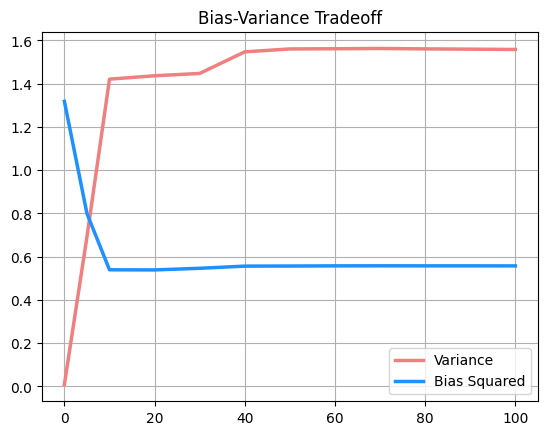

In [ ]:
D = [0, 5, 10, 20, 30, 40, 50, 60 ,70, 80, 90, 100]
vars_all = vars1 + vars
bias_sqrs_all = bias_sqrs1 + bias_sqrs
plt.plot(figsize=(8,6))
plt.plot(D, vars_all, label='Variance', color='lightcoral', linewidth=2.5)
plt.plot(D, bias_sqrs_all, label='Bias Squared', color='dodgerblue',linewidth=2.5)
plt.title('Bias-Variance Tradeoff')
plt.legend()
plt.grid(True)
plt.show()